In [2]:
pip install matplotlib

Note: you may need to restart the kernel to use updated packages.


In [1]:
'''Se importan librerias necesarias para el procesamiento'''
import re
import operator
import nltk
nltk.download('punkt')
nltk.download('stopwords')
import numpy as np
from bs4 import BeautifulSoup
from urllib.request import urlopen
import pandas as pd
import tqdm
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

'''Se define la cantidad maxima de filas que se mostraran'''
pd.options.display.max_rows = 25

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\57321\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\57321\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [2]:
'''Se define una lista vacia para guardar cada una de las url de las noticias'''
links = []

'''Se define un bucle que consulta un numero de paginas, extrae el codigo HTML y extrae la url de cada noticia'''
#for i in range (1,25):
for i in tqdm.tqdm(range (1,1000)):
    if i == 1:
        Busqueda_Pagina = urlopen('https://www.eltiempo.com/buscar?q=&contentTypes%5B0%5D=article')
    else:
        #Extraccion y procesamiento del html de la pagina web
        Busqueda_Pagina = urlopen('https://www.eltiempo.com/buscar/'+str(i)+'?q=&contentTypes%5B0%5D=article')
    
    CodHTML_Busqueda = Busqueda_Pagina.read().decode('utf-8')
    CodHTML_Busqueda_Clean = BeautifulSoup(CodHTML_Busqueda)
    Tabla = CodHTML_Busqueda_Clean.find_all( attrs = {'class': 'title page-link'})
    
    # Almacena cada una de las url que encontro en la pagina
    for link in Tabla:
        links.append('https://www.eltiempo.com'+link.get('href'))

print('Se extrajo la url de ' + str(len(links)) + ' noticias')

100%|████████████████████████████████████████████████████████████████████████████████| 999/999 [15:55<00:00,  1.05it/s]

Se extrajo la url de 9990 noticias


In [3]:
'''Algunas de las primeras noticias no se encuentran por lo que se inicia el procesamiento desde la noticia '''
#links = links[13:len(links)]
links = links[20:len(links)]
print('Se procesaran ' + str(len(links)) + ' noticias')

Se procesaran 9970 noticias


In [4]:
'''Se define una lista vacias para almacenar las noticias'''
Noticias=[]

'''Se realiza scraping a la pagina web para extraer el titulo, la informacion, el contenido y la fecha de cada noticias'''
links2 = links

for noticia in tqdm.tqdm(links):
    try:
        pagina=urlopen(noticia)
        CodHTML=pagina.read().decode("utf-8")
        pagina_noticia=BeautifulSoup(CodHTML)

        # Extraccion del titulo de la noticia
        if pagina_noticia.find( 'h1')!=None:
            titulo=pagina_noticia.find( 'h1').get_text(' ', strip=True)
        else:
            titulo=""

        # Extraccion de la informacion de la noticia
        if pagina_noticia.find( attrs={'class': 'info'})!=None:
            info=pagina_noticia.find( attrs={'class': 'info'}).get_text(' ', strip=True)
        else:
            info="" 

        # Extraccion de la fecha de la noticia
        if pagina_noticia.find( attrs={'class': 'fecha'})!=None:
            Fecha = pagina_noticia.find( attrs={'class': 'fecha'}).get_text(' ', strip=True)
        else:
            Fecha=""

        # Extraccion del contenido de la noticia
        tabla = pagina_noticia.find_all( attrs={'class': 'contenido'})
        tabla= [i.get_text(' ', strip=True) for i in tabla]
        tabla=' '.join(tabla)

        # Se consolidan las variables extraidas dentro de la lista vacia
        Noticias.append([titulo,info,tabla, Fecha])
    except:
        links.remove(noticia)
        print('La noticia ', noticia, 'no se pudo descargar')
        pass

100%|████████████████████████████████████████████████████████████████████████████| 9970/9970 [3:58:52<00:00,  1.44s/it]


In [5]:
'''Se construye un dataframe para consolidar toda la informacion de las noticias'''
# utilizar len noticias
col_names = ['Titulo','Informacion','Contenido', 'Fecha']
Noticias = pd.DataFrame(Noticias, columns = col_names, )
Noticias.insert(0, 'Enlace', links, True)
Etiqueta = []
for i in range(0, len(Noticias['Enlace'])):
    Etiqueta.append(re.sub("([]'[])",'',str(re.findall('(?<=\.com/)+[a-z-]+',Noticias['Enlace'][i]))))
Noticias.insert(4, 'Etiqueta', Etiqueta, True)
Noticias.style.set_properties(subset=['Enlace', 'Titulo', 'Informacion','Etiqueta'], **{'text-align': 'center'})

'''Se adiciona columna para registrar la hora de publicacion de la noticia'''
Noticias['Hora'] = 0

Noticias

,Enlace,Titulo,Informacion,Contenido,Etiqueta,Fecha,Hora
0,https://www.eltiempo.com/colombia/cali/choque-...,Aparatoso accidente: camión se volcó y chocó 5...,Las autoridades y organismos de socorro auxili...,Un aparatoso accidente en una de las calles de...,colombia,"02 de octubre 2020 , 09:57 p. m.",0
1,https://www.eltiempo.com/mundo/europa/enfermed...,El raro caso de la niña que nació con ‘máscara...,La pequeña ha sido sometida a tres cirugías qu...,Un grupo de cirujanos de la Clínica Regional d...,mundo,"02 de octubre 2020 , 09:55 p. m.",0
2,https://www.eltiempo.com/cultura/entretenimien...,"Anthony Galindo, quien hizo parte Menudo, en g...",El venezolano está en una clínica de Miami y s...,"Anthony Galindo , quien hizo parte del grupo M...",cultura,"02 de octubre 2020 , 09:51 p. m.",0
3,https://www.eltiempo.com/justicia/cortes/desde...,La deuda del Estado con la regulación de la pr...,"Hace 3 años, Corte tumbó artículos del Código ...","Las protestas de noviembre del año pasado, las...",justicia,"02 de octubre 2020 , 09:45 p. m.",0
4,https://www.eltiempo.com/mundo/eeuu-y-canada/q...,"En medio de la campaña, Trump despacha desde u...","El presidente de EE. UU., que dio positivo por...","La campaña presidencial en EE. UU., de por sí ...",mundo,"02 de octubre 2020 , 09:40 p. m.",0
...,...,...,...,...,...,...,...
9965,https://www.eltiempo.com/politica/gobierno/gob...,"‘Las obras no tienen dueño político’: Duque, e...",El presidente entregó 89 kilómetros de vía de ...,"Este jueves, el presidente Iván Duque entregó ...",politica,"30 de julio 2020 , 04:23 p. m.",0
9966,https://www.eltiempo.com/bogota/clima-en-bogot...,¿Por qué hace tanto frío en Bogotá?,Julio no ha sido el mes cálido que se esperaba...,"Históricamente, julio ha sido para los bogotan...",bogota,"30 de julio 2020 , 04:23 p. m.",0
9967,https://www.eltiempo.com/vida/ciencia/virologa...,‘No procede de la naturaleza’: viróloga dice q...,"La especialista aseguró que teme por su vida, ...","Li-Meng Yan, la viróloga china que huyó a Esta...",vida,"30 de julio 2020 , 04:15 p. m.",0
9968,https://www.eltiempo.com/politica/congreso/ley...,En canoas y burros se podrán transportar niños...,La nueva ley busca garantizar a los niños de l...,"Esta semana, el presidente Iván Duque sancionó...",politica,"30 de julio 2020 , 04:08 p. m.",0


In [6]:
Noticias.to_csv('Noticias_Extraidas_9970', index= 0)

# Check Point

In [1]:
'''Se importan librerias necesarias para el procesamiento'''
import re
import operator
import nltk
nltk.download('punkt')
nltk.download('stopwords')
import numpy as np
from bs4 import BeautifulSoup
from urllib.request import urlopen
import pandas as pd
import tqdm
import matplotlib.pyplot as plt
import tqdm
from tqdm import tqdm

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from nltk.corpus import stopwords
#nltk.download('stopwords')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\57321\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\57321\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [2]:
'''Se extrae la data de las noticias extraidas y se eliminan los registros que no tiene informacion'''

pd.options.display.max_rows = 50
Noticias = pd.read_csv('Noticias_Extraidas_9970', index_col=0)
Noticias = Noticias.dropna()
Noticias = Noticias.reset_index()

'''La columna Fecha se divide en dos columnas (Fecha y Hora)'''
for i in range (len(Noticias['Fecha'])):
    Date_Temp = Noticias['Fecha'][i].split(' ,')
    Noticias['Fecha'][i] = Date_Temp[0]
    Noticias['Hora'][i] = Date_Temp[1]

#Noticias['Etiqueta'][238] = 'bogota' # Se ajusta un registro que por estructura no toma de forma correcta la etiqueta
#Noticias

<ipython-input-2-82700997f8e7>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Noticias['Fecha'][i] = Date_Temp[0]
<ipython-input-2-82700997f8e7>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Noticias['Hora'][i] = Date_Temp[1]
C:\Users\57321\anaconda3\lib\site-packages\pandas\core\indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


# Analisis Descriptivo

In [3]:
'''Se realiza una tabla de frecuencias por Etiqueta'''
Etiquetas = pd.DataFrame(Noticias.groupby('Etiqueta').count()['Enlace'].sort_values(ascending = False))
Etiquetas['% PARTICIPACION'] = round(Etiquetas['Enlace'] / Etiquetas['Enlace'].sum(), ndigits=4)*100
Etiquetas = Etiquetas.rename(columns = {'Enlace':'CANTIDAD'})
Etiquetas

,CANTIDAD,% PARTICIPACION
Etiqueta,,
deportes,1582,17.74
colombia,1574,17.65
cultura,1012,11.35
mundo,706,7.92
bogota,680,7.63
politica,677,7.59
justicia,600,6.73
vida,546,6.12
economia,516,5.79


Text(0, 0.5, 'Etiquetas')

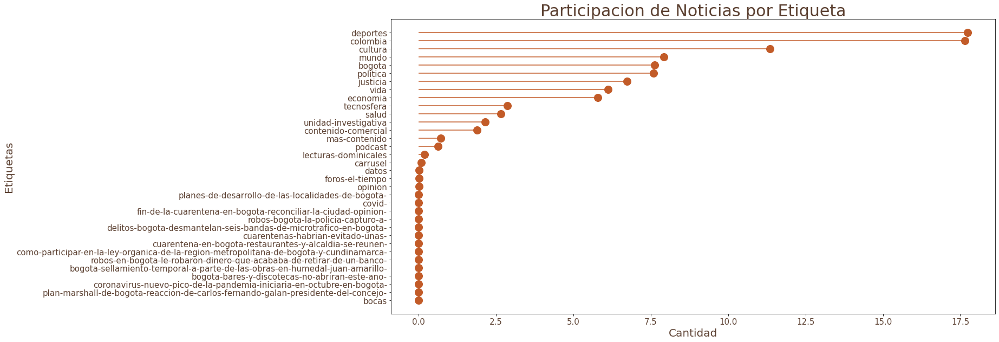

In [4]:



Etiquetas = Etiquetas.sort_values(by = '% PARTICIPACION', ascending= True)
plt.figure(figsize=(20,10))
plt.hlines(y = Etiquetas.index, xmin = 0, xmax=Etiquetas['% PARTICIPACION'], color='#C25B28')
plt.plot(Etiquetas['% PARTICIPACION'], Etiquetas.index, "o", color = '#C25B28', markersize=14)

plt.yticks(Etiquetas.index,  size = 15, color = '#5C4132')
plt.xticks(size = 15, color = '#5C4132')
plt.title("Participacion de Noticias por Etiqueta", loc='center', size = 30, color = '#5C4132')
plt.xlabel('Cantidad', size = 20, color = '#5C4132')
plt.ylabel('Etiquetas', size = 20, color = '#5C4132')

In [5]:
'''Se importan librerias para la conversion del campo Fecha'''
import datetime
from datetime import datetime
import locale
locale.setlocale(locale.LC_TIME, "es_ES")

'''Se realiza tabla para conocer volumen de noticias por dia '''
Fechas_Unicas = Noticias['Fecha'].unique()
Fechas_Unicas.sort()

Q_Noticias = []
for i in range(len(Fechas_Unicas)):
    Q = len(Noticias[Noticias['Fecha'] == Fechas_Unicas[i]])
    Q_Noticias.append(Q)

Noti_Diarias = pd.DataFrame(Fechas_Unicas)
Noti_Diarias['NOTICIAS'] = Q_Noticias
Noti_Diarias.rename(columns={0: 'FECHA PUBLICACION'}, inplace=True)

for bd in range(0, len(Noti_Diarias['FECHA PUBLICACION'])):
    Noti_Diarias['FECHA PUBLICACION'][bd] = datetime.strptime(Noti_Diarias['FECHA PUBLICACION'][bd], '%d de %B %Y').date()

Noti_Diarias = Noti_Diarias.sort_values(by = 'FECHA PUBLICACION')
Noti_Diarias

<ipython-input-5-db016a12f457>:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Noti_Diarias['FECHA PUBLICACION'][bd] = datetime.strptime(Noti_Diarias['FECHA PUBLICACION'][bd], '%d de %B %Y').date()


,FECHA PUBLICACION,NOTICIAS
61,2020-07-30,51
64,2020-07-31,175
0,2020-08-01,79
3,2020-08-02,77
6,2020-08-03,145
...,...,...
57,2020-09-28,171
59,2020-09-29,187
62,2020-09-30,149
1,2020-10-01,165


In [6]:
Noti_Diarias.sort_values(by = 'FECHA PUBLICACION')

,FECHA PUBLICACION,NOTICIAS
61,2020-07-30,51
64,2020-07-31,175
0,2020-08-01,79
3,2020-08-02,77
6,2020-08-03,145
...,...,...
57,2020-09-28,171
59,2020-09-29,187
62,2020-09-30,149
1,2020-10-01,165


Text(0, 0.5, 'Fecha')

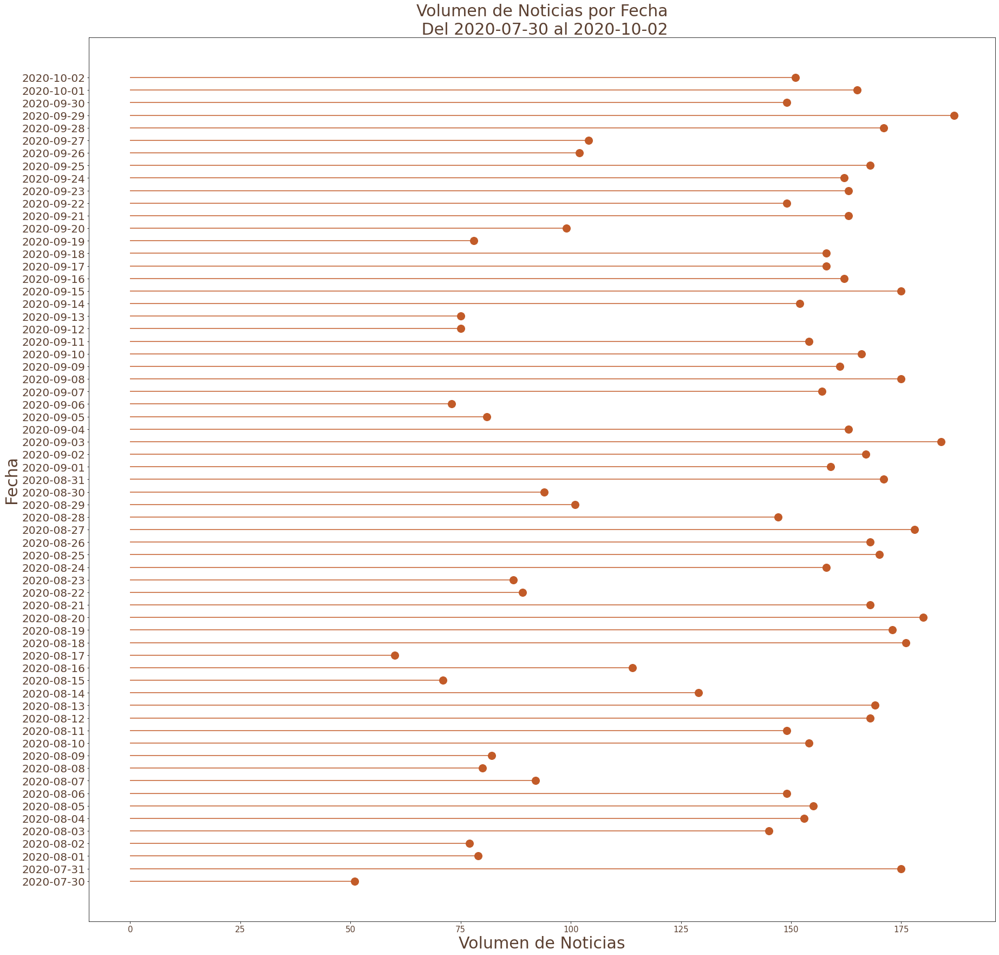

In [41]:
#Etiquetas = Etiquetas.sort_values(by = '% PARTICIPACION', ascending= True)
plt.figure(figsize=(30,30))
plt.hlines(y = Noti_Diarias['FECHA PUBLICACION'], xmin = 0, xmax=Noti_Diarias['NOTICIAS'], color='#C25B28')
plt.plot(Noti_Diarias['NOTICIAS'], Noti_Diarias['FECHA PUBLICACION'], "o", color = '#C25B28', markersize=14)

plt.yticks(Noti_Diarias['FECHA PUBLICACION'],  size = 20, color = '#5C4132')
plt.xticks(size = 15, color = '#5C4132')
plt.title('Volumen de Noticias por Fecha\n Del ' + str(min(Noti_Diarias['FECHA PUBLICACION'])) + 
          ' al ' + str(max(Noti_Diarias['FECHA PUBLICACION'])) , loc='center', size = 30, color = '#5C4132')
plt.xlabel('Volumen de Noticias', size = 30, color = '#5C4132')
plt.ylabel('Fecha', size = 30, color = '#5C4132')

In [8]:
from IPython.core.display import HTML, display
from ipywidgets import interact, interactive
import ipywidgets as widgets

In [9]:
def _Date_(Fecha):
    display(HTML('<h2>Volumen diario de publicaciones por etiqueta</h2>'+
                '<p>Seleccione la fecha para conocer la participacion de las noticias por etiqueta:</p>'))
    
    dt = Noticias[Noticias['Fecha'] == Fecha].groupby('Etiqueta').count()
    indices = dt.index
    data = dt['Enlace']
    fig, ax = plt.subplots(figsize = (12,8), subplot_kw = dict(aspect = 'equal'))
    wedges, texts = ax.pie(data, wedgeprops = dict(width = 0.5), startangle = -40)
    #wedges, texts = ax.bar(Noticias.index , Noticias['Fecha'],  color = '#5C4132')
    
    pct=["{:.2%}".format(da/sum(data)) for da in data]
    bbox_props = dict(boxstyle="square,pad=0.3", fc="w", ec="k", lw=0.8)
    kw = dict(arrowprops=dict(arrowstyle="-"),
              bbox=bbox_props, zorder=0, va="center")
    
    for i, p in enumerate(wedges):
        ang = (p.theta2 - p.theta1)/2. + p.theta1
        y = np.sin(np.deg2rad(ang))        
        x = np.cos(np.deg2rad(ang))
        horizontalalignment = {-1: "right", 1: "left"}[int(np.sign(x))]
        connectionstyle = "angle,angleA=0,angleB={}".format(ang)
        kw["arrowprops"].update({"connectionstyle": connectionstyle})
        ax.annotate(indices[i]+"  "+pct[i], xy=(x, y),
                    xytext=(1.35*np.sign(x), 1.4*y),
                    horizontalalignment=horizontalalignment, **kw)
    ax.set_title("Participacion de noticias publicadas el "+ Fecha +
                 "\n\n"+str(sum(data))+" noticias publicadas"+"\n")
    
    plt.show()
    return

Liloc=list(Noticias['Fecha'].unique()) # Extraemos la lista de localidades

interact(_Date_, Fecha=widgets.Dropdown(options=Liloc,value = max(Liloc), 
                                       description="Fecha:", 
                                       disabled=False,))

interactive(children=(Dropdown(description='Fecha:', index=63, options=('02 de octubre 2020', '01 de octubre 2…

<function __main__._Date_(Fecha)>

# Preprocesamiento

In [12]:
'''Se crea una lista vacia y se construye un corpus del contenido de todas las noticias'''
Corpus_Noticias = ''

for i in tqdm(range(len(Noticias['Contenido']))):
               Corpus_Noticias = Corpus_Noticias + Noticias['Contenido'][i]

'''Se reemplazan las letras con diacritico por la letra sin el diacritico, excepto la ñ'''
from unicodedata import normalize
Corpus_Noticias = re.sub(r"([^n\u0300-\u036f]|n(?!\u0303(?![\u0300-\u036f])))[\u0300-\u036f]+", r"\1", 
        normalize( "NFD", Corpus_Noticias), 0, re.I)

'''Se reemplazan diferentes signos de puntuacion'''
Corpus_Noticias = re.sub(r"[,.:;@'""'‘’“”%!?¿¡)0-9(-]+","",Corpus_Noticias)
Corpus_Noticias = re.sub(r'"(?!")', '', Corpus_Noticias)
Corpus_Noticias = Corpus_Noticias.replace('\xa0',' ')

'''Se convierte todo el texto en minuscula'''
Corpus_Noticias = Corpus_Noticias.lower()

100%|██████████████████████████████████████████████████████████████████████████████| 8918/8918 [05:06<00:00, 29.06it/s]


In [13]:
'''Se divide el corpus por palabras tomando como criterio un espacio'''
print('El corpus completo esta compuesto por ' + str(len(Corpus_Noticias.split(' '))) + ' palabras y por '  + str(len(Corpus_Noticias)) + ' caracteres')

El corpus completo esta compuesto por 6309538 palabras y por 35919979 caracteres


In [14]:
'''Se crea una lista con el corpus separado por palabras'''
Corpus_Noticias_Words = Corpus_Noticias.split(' ')

'''Se crea una lista vacia para cargar las palabras no vacias'''
My_Stop_Words = set(stopwords.words('spanish'))
My_Stop_Words.update(['mas', 'asi'])
Palabras_sin_Stop_Words = []

'''Se crea una lista de palabras excluyendo las palabras vacias'''
for i in range(len(Corpus_Noticias_Words)):
    if Corpus_Noticias_Words[i] not in My_Stop_Words and len(Corpus_Noticias_Words[i]) >= 3:
        #print(Corpus_Noticias_Words[i])
        Palabras_sin_Stop_Words.append(re.sub("[^a-z]", "", Corpus_Noticias_Words[i]))

Palabras_sin_Stop_Words.sort()

print('El conjunto de palabras despues de retirar las palabras vacias es de ' + str(len(Palabras_sin_Stop_Words)) + ' palabras')

El conjunto de palabras despues de retirar las palabras vacias es de 3117369 palabras


In [15]:
'''Se crea un diccionario para relacionar la palabra con la cantidad de repeticiones en el texto'''
Frecuencias={}
for palabra in tqdm(Palabras_sin_Stop_Words): 
    if palabra in Frecuencias: # Si la palabra se encuentra en el diccionario
        Frecuencias[palabra]+=1 # Sume 1
    else: # Si la palabra no se encuentra en el diccionario
        Frecuencias[palabra] = 1 # La crea

Frecuencias

100%|███████████████████████████████████████████████████████████████████| 3117369/3117369 [00:01<00:00, 1833285.68it/s]


{'': 26,
 'a': 4,
 'aaa': 3,
 'aaacol': 1,
 'aaerosub': 1,
 'aakko': 1,
 'aalerud': 1,
 'aalsmeer': 1,
 'aalto': 1,
 'aanarquistas': 1,
 'aardman': 1,
 'aaron': 18,
 'aarquitecto': 1,
 'aatrox': 1,
 'ab': 2,
 'abaco': 4,
 'abad': 25,
 'abadia': 7,
 'abajo': 159,
 'abajopara': 1,
 'abalanza': 1,
 'abalanzamos': 1,
 'abalanzan': 2,
 'abalanzarnos': 1,
 'abalanzaron': 4,
 'abalanzo': 8,
 'abaleado': 1,
 'abalearon': 1,
 'abanderado': 5,
 'abanderan': 2,
 'abanderando': 2,
 'abanderar': 1,
 'abandero': 1,
 'abandona': 27,
 'abandonaban': 5,
 'abandonada': 24,
 'abandonadas': 14,
 'abandonado': 63,
 'abandonados': 21,
 'abandonan': 17,
 'abandonando': 8,
 'abandonandolos': 2,
 'abandonar': 144,
 'abandonara': 13,
 'abandonaran': 5,
 'abandonaremos': 2,
 'abandonarla': 1,
 'abandonarlo': 9,
 'abandonarlos': 2,
 'abandonaron': 29,
 'abandone': 16,
 'abandonemos': 2,
 'abandonen': 10,
 'abandones': 1,
 'abandono': 156,
 'abandonos': 6,
 'abanico': 21,
 'abanicos': 7,
 'abarata': 1,
 'abaratar'

In [16]:
'''Se organizan las tuplas de forma descendente para viusalizar desde la palabra mas utilizada'''
import operator
from collections import Counter
Frecuencias_ordenadas=sorted(Frecuencias.items(),key=operator.itemgetter(1),reverse=True)
Frec_Ordenado=dict((key,value) for key,value in Frecuencias_ordenadas)
Frec_Ordenado

{'accidente': 17408,
 'transito': 17407,
 'agentes': 17365,
 'cordoba': 17076,
 'tambien': 16274,
 'colombia': 15768,
 'ser': 15456,
 'caso': 13294,
 'mundo': 12705,
 'puede': 11941,
 'mujer': 10702,
 'paso': 10614,
 'varios': 10516,
 'violencia': 10457,
 'habria': 9900,
 'hijo': 9724,
 'padres': 9506,
 'victima': 9344,
 'regreso': 9299,
 'municipios': 9264,
 'anos': 9238,
 'pequeno': 9191,
 'casas': 9109,
 'actualidad': 8975,
 'pegado': 8935,
 'carros': 8845,
 'donaciones': 8789,
 'choco': 8759,
 'civiles': 8754,
 'alerta': 8753,
 'enterado': 8733,
 'midase': 8718,
 'mensajes': 8660,
 'camion': 8657,
 'ninez': 8636,
 'volco': 8601,
 'maltratos': 8597,
 'aparatoso': 8583,
 'agresora': 8579,
 'bandas': 8547,
 'temor': 8532,
 'convence': 8493,
 'aparicion': 8451,
 'panfletos': 8333,
 'grafitis': 8321,
 'amenazantes': 8315,
 'intimidantes': 8307,
 'crimin': 8304,
 'ademas': 8168,
 'pais': 7274,
 'dos': 7217,
 'personas': 7007,
 'tiempo': 6971,
 'lea': 6537,
 'dijo': 6310,
 'interesar': 61

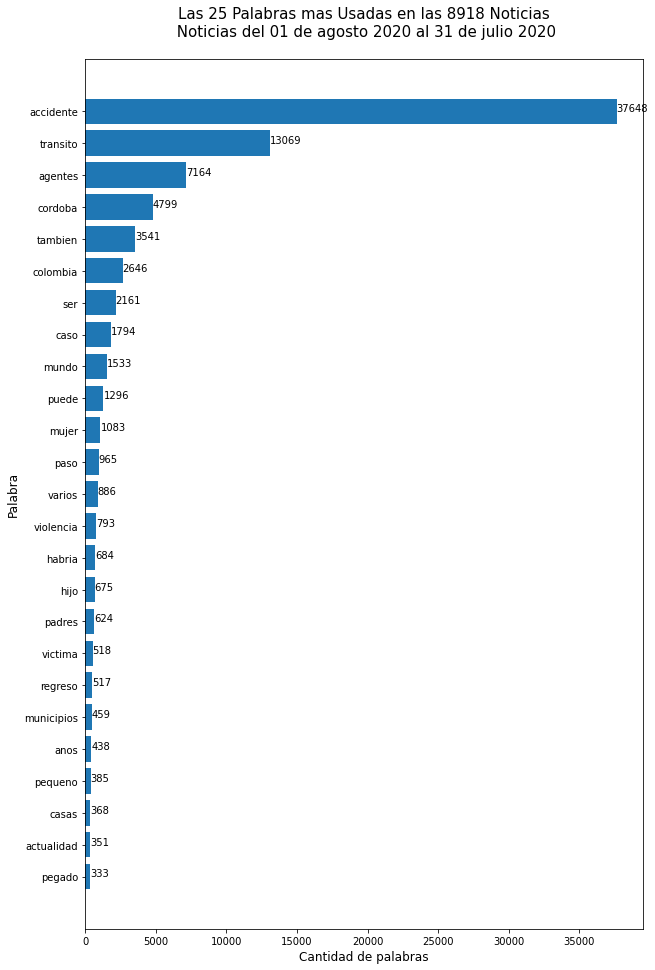

In [17]:
'''Se toman las primeras 25 tuplas del diccionario de frecuencias de palabras'''
Palabras_25 = pd.DataFrame(Counter(Frec_Ordenado.keys()).most_common(25))[0]
Frecuencias_25 = pd.DataFrame(Counter(Frec_Ordenado.values()).most_common(25))[1]

'''Se crea un dataframe vacio para relacionar las 25 palabras mas usadas y se asocian los valores'''
Pal_mas_Usa_25 = pd.DataFrame()
Pal_mas_Usa_25['Palabra'] = Palabras_25
Pal_mas_Usa_25['Frecuencia'] = Frecuencias_25
Pal_mas_Usa_25 = Pal_mas_Usa_25.sort_values(by= 'Frecuencia')

'''Se realiza un grafico de barras horizontales para visualizar los volumenes de palabras mas usadas'''
plt.figure(figsize=(10,16))
plt.barh(range(len(Pal_mas_Usa_25)), list(Pal_mas_Usa_25['Frecuencia']), align='center')
for index, value in enumerate(Pal_mas_Usa_25['Frecuencia']):
    plt.text(value, index, str(value))
plt.yticks(range(len(Pal_mas_Usa_25)), list(Pal_mas_Usa_25['Palabra']),rotation=0)
plt.title('Las 25 Palabras mas Usadas en las '+ str(len(Noticias)) +
          ' Noticias\n Noticias del ' + min(Liloc) + ' al ' + max(Liloc) + '\n',size = 15)
plt.ylabel("Palabra", size = 12)
plt.xlabel("Cantidad de palabras", size = 12)
plt.show()

In [18]:
'''Ajustar el nan que salio'''
Noticias_Limpias=[]
for j,i in tqdm(enumerate(Noticias["Contenido"])):
    if type(i) == str:
        Noticias_Limpias.append(re.sub( "[^A-Za-zóáéíúÁÉÍÓÚüÜñÑ.]+",' ',i))
#    print(j)

8918it [00:01, 4751.21it/s]


In [19]:
Noticias_Limpias

['Un aparatoso accidente en una de las calles de Yumbo Valle del Cauca se registró hacia las de la mañana de este viernes. En el siniestro cuatro vehículos entre ellos tres carros particulares y una volqueta quedaron afectados. La volqueta se volcó en la mitad de una estrecha vía la cual está ubicada en una empinada zona de este municipio del Valle del Cauca. De acuerdo con versiones preliminares la volqueta chocó contra los carros particulares hecho que terminó además afectando las fachadas de cinco viviendas. Según los Bomberos por falla en los frenos el camión se precipitó por la vía que tiene una pendiente llevándose a su paso postes y los tres vehículos que estaban estacionados en la calle. El accidente ocurrió en el barrio Uribe. Tres ocupantes de la volqueta resultaron con lesiones múltiples y fueron rescatados de entre las latas retorcidas por los bomberos y miembros de otros organismos de socorro. CALI El narcoavión hallado por la DEA y la Fiscalía en las selvas de Tumaco Temo

In [20]:
'''Se eliminan las palabras vacias y se deja una unica ocurrencia de la palabra'''
Notic_sin_Vacias = []
for i in tqdm(range(len(Noticias_Limpias))):
    Notic_sin_Vacias.append([j.lower() for j in Noticias_Limpias[i].split() if not j.lower() in My_Stop_Words])

100%|████████████████████████████████████████████████████████████████████████████| 8918/8918 [00:01<00:00, 4784.30it/s]


In [21]:
Notic_sin_Vacias

[['aparatoso',
  'accidente',
  'calles',
  'yumbo',
  'valle',
  'cauca',
  'registró',
  'hacia',
  'mañana',
  'viernes.',
  'siniestro',
  'cuatro',
  'vehículos',
  'tres',
  'carros',
  'particulares',
  'volqueta',
  'quedaron',
  'afectados.',
  'volqueta',
  'volcó',
  'mitad',
  'estrecha',
  'vía',
  'ubicada',
  'empinada',
  'zona',
  'municipio',
  'valle',
  'cauca.',
  'acuerdo',
  'versiones',
  'preliminares',
  'volqueta',
  'chocó',
  'carros',
  'particulares',
  'hecho',
  'terminó',
  'además',
  'afectando',
  'fachadas',
  'cinco',
  'viviendas.',
  'según',
  'bomberos',
  'falla',
  'frenos',
  'camión',
  'precipitó',
  'vía',
  'pendiente',
  'llevándose',
  'paso',
  'postes',
  'tres',
  'vehículos',
  'estacionados',
  'calle.',
  'accidente',
  'ocurrió',
  'barrio',
  'uribe.',
  'tres',
  'ocupantes',
  'volqueta',
  'resultaron',
  'lesiones',
  'múltiples',
  'rescatados',
  'latas',
  'retorcidas',
  'bomberos',
  'miembros',
  'organismos',
  'soc

In [22]:
Notic_sin_Vacias_2 = [' '.join(i) for i in tqdm(Notic_sin_Vacias)]

100%|███████████████████████████████████████████████████████████████████████████| 8918/8918 [00:00<00:00, 95131.87it/s]


In [23]:
Notic_sin_Vacias_2

['aparatoso accidente calles yumbo valle cauca registró hacia mañana viernes. siniestro cuatro vehículos tres carros particulares volqueta quedaron afectados. volqueta volcó mitad estrecha vía ubicada empinada zona municipio valle cauca. acuerdo versiones preliminares volqueta chocó carros particulares hecho terminó además afectando fachadas cinco viviendas. según bomberos falla frenos camión precipitó vía pendiente llevándose paso postes tres vehículos estacionados calle. accidente ocurrió barrio uribe. tres ocupantes volqueta resultaron lesiones múltiples rescatados latas retorcidas bomberos miembros organismos socorro. cali narcoavión hallado dea fiscalía selvas tumaco temor córdoba aparición panfletos grafitis amenazantes inversión buen servicio pedido alcaldes operadores energía agentes tránsito p. m. convence regreso agentes tránsito civiles conductores expertos movilidad enfatizan necesidad transpar ... donaciones p. m. enterado actualidad colombia mundo mídase test prueba usted

In [24]:
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer = TfidfVectorizer()
X = vectorizer.fit_transform(Notic_sin_Vacias_2)
X

<8918x97293 sparse matrix of type '<class 'numpy.float64'>'
	with 2359133 stored elements in Compressed Sparse Row format>

In [25]:
'''Se definene las caracteristicas del cluster'''
from sklearn.cluster import KMeans
true_k = 15
modelTFI = KMeans(n_clusters=true_k, init='k-means++', max_iter=100, n_init=1)
modelTFI.fit(X)

order_centroids = modelTFI.cluster_centers_.argsort()[:, ::-1]
terms = vectorizer.get_feature_names()

In [26]:
'''Se visualiza la clusterizacion'''
for i in range(true_k):
    print("Cluster %d:" % i),
    for ind in order_centroids[i, :8]:
        print(" %s" % terms[ind])

Cluster 0:
 bogotá
 ciudad
 bioseguridad
 protocolos
 pico
 transporte
 restaurantes
 medidas
Cluster 1:
 accidente
 tránsito
 córdoba
 agentes
 años
 ser
 puede
 mundo
Cluster 2:
 salud
 covid
 casos
 virus
 coronavirus
 pacientes
 pandemia
 contagios
Cluster 3:
 trump
 mancuso
 biden
 unidos
 presidente
 extradición
 uu
 ee
Cluster 4:
 policía
 ordóñez
 javier
 protestas
 cai
 policías
 bogotá
 policial
Cluster 5:
 spotify
 episodio
 aplicación
 café
 www
 través
 eltiempo
 primer
Cluster 6:
 educación
 estudiantes
 páramo
 medellín
 universidad
 colegios
 valle
 cauca
Cluster 7:
 policía
 farc
 víctimas
 córdoba
 agentes
 años
 fiscalía
 tránsito
Cluster 8:
 ciento
 millones
 pesos
 empresas
 país
 billones
 economía
 proyecto
Cluster 9:
 uribe
 corte
 expresidente
 álvaro
 suprema
 senador
 justicia
 cepeda
Cluster 10:
 vacuna
 vacunas
 covid
 dosis
 ensayos
 salud
 fase
 rusia
Cluster 11:
 vs
 espn
 fútbol
 sports
 liga
 nba
 canal
 fox
Cluster 12:
 casos
 contagios
 covid
 muerte

<h1>Catalogacion de los Cluster</h1>
<h3>Cluster 0</h3>
<p>El cluster 0 contiene noticias sobre la nueva normalidad despues de la cuarentena por la pandemia.</p>
<h3>Cluster 1</h3>
<p>El cluster 1 contiene noticas sobre un accidente de transito en Valle del Cauca y sobre el atentado a escoltas de Piedad Córdoba y panfletos en el departamento de Córdoba.</p>
<h3>Cluster 2</h3>
<p>El cluster 2 contiene noticias sobre todo lo relacionado con COVID respecto a nuevos contagios.</p>
<h3>Cluster 3</h3>
<p>El cluster 3 contiene noticias sobre la extradicion de Mancuso y sobre los debates presidenciales entre Trump y Biden, tambien posiblemente por el contagio de COVID de Trump.</p>
<h3>Cluster 4</h3>
<p>El cluster 4 contiene noticias sobre el proceso de asesinato de Ordoñez, las protestas, el ataque a policias y la destruccion de CAIS.</p>
<h3>Cluster 5</h3>
<p>El cluster 5 contiene temas de Ocio y las noticias entregadas por los podcast.</p>
<h3>Cluster 6</h3>
<p>El cluster 6 contiene noticias sobre educación y el retorno a colegios y universidades, ademas del peligro para los venezolanos en el Páramo de Berlin en Santander.</p>
<h3>Cluster 7</h3>
<p>El cluster 7 contiene noticias sobre justicia y el caso de Piedad Córdoba asociada al asesinato de Alvaro Gomez Hurtado.</p>
<h3>Cluster 8</h3>
<p>El cluster 8 contiene noticas sobre economía en general.</p>
<h3>Cluster 9</h3>
<p>El cluster 9 contiene noticias sobre el caso de Alvaro Uribe.</p>
<h3>Cluster 10</h3>
<p>El cluster 10 contiene noticias sobre la nueva vacuna contra el COVID, en especial la desarrollada por Rusia.</p>
<h3>Cluster 11</h3>
<p>El cluster 11 contiene noticias sobre deportes y canales de deportes.</p>
<h3>Cluster 12</h3>
<p>El cluster 12 contiene noticias sobre COVID respecto a fallecimientos en el valle, que ha tenido incremento importante los últimos días.</p>
<h3>Cluster 13</h3>
<p>El cluster 13 contiene noticias sobre futbol internacional y el desempeño de James en el Everton.</p>
<h3>Cluster 14</h3>
<p>El cluster 14 contiene noticias sobre ciclismo y el tour de Francia.</p>


In [42]:
for i in range(15):
    print('El cluster ' + str(i) + ' tiene ' + str(list(modelTFI.predict(X)).count(i)) + ' Noticias')

El cluster 0 tiene 610 Noticias
El cluster 1 tiene 3068 Noticias
El cluster 2 tiene 443 Noticias
El cluster 3 tiene 287 Noticias
El cluster 4 tiene 291 Noticias
El cluster 5 tiene 44 Noticias
El cluster 6 tiene 357 Noticias
El cluster 7 tiene 1137 Noticias
El cluster 8 tiene 964 Noticias
El cluster 9 tiene 248 Noticias
El cluster 10 tiene 97 Noticias
El cluster 11 tiene 72 Noticias
El cluster 12 tiene 111 Noticias
El cluster 13 tiene 806 Noticias
El cluster 14 tiene 383 Noticias
